In [160]:
import json
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np
import tifffile
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import RandomHorizontalFlip, RandomVerticalFlip, Normalize, RandomCrop, Compose
from einops import rearrange

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
import multiplex_imaging_pipeline.utils as utils
from vit_pytorch import ViT, MAE
from vit_pytorch.slide_mae import SlideMAE

In [5]:
metadata = json.load(open('../data/test_registration/HT397B1_v2/registered/metadata.json'))
metadata

{'downsample_scaler': 0.1,
 'phenocycler_pixels_per_micron': 1.9604911906033102,
 'order': ['HT397B1-S1H3A1U1',
  'HT397B1-S1H3A1U2',
  'HT397B1-S1H3A1U12',
  'HT397B1-S1H3A1U21',
  'HT397B1-S1H3A1U22',
  'HT397B1-S1H3A1U31'],
 'data_type': ['visium', 'codex', 'codex', 'visium', 'codex', 'codex'],
 'slices': ['s0', 's1', 's2', 's3', 's4', 's5']}

In [7]:
fps = sorted(utils.listfiles('/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered',
                     regex='ome.tiff$'))
fps

['/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s1.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s2.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s4.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT397B1_v2/registered/s5.ome.tiff']

In [9]:
channels = ['Bap1',
 'CD31',
 'CD45',
 'CD68',
 'CD8',
 'CK14',
 'CK19',
 'COX6c',
 'DAPI',
 'ER',
 'FOXP3',
 'GATA3',
 'GLUT1',
 'HLA-DR',
 'Her2',
 'Ki67',
 'MGP',
 'PLAT/tPA',
 'PR',
 'Pan-Cytokeratin',
 'Podoplanin',
 'SMA',
 'Vimentin',
 'cKit']


In [10]:
scale = .1
slide_to_img = {}
for fp in fps:
    sample = fp.split('/')[-1].replace('.ome.tiff', '')
    cs, img = utils.extract_ome_tiff(fp, as_dict=False)
    img = torch.tensor(img)
    thumbnail = TF.resize(img, (int(scale * img.shape[-2]), int(scale * img.shape[-1])))
    thumbnail = thumbnail.to(torch.float32)
    
    cs = [utils.R_CHANNEL_MAPPING[c] for c in cs]
    idxs = [cs.index(c) for c in channels]
    thumbnail = thumbnail[idxs]
    
    slide_to_img[sample] = thumbnail

In [135]:
class MAETransform(object):
    def __init__(self, size=(256, 256), normalize=None):
        self.transforms = Compose([
            RandomCrop(size, padding_mode='reflect'),
            RandomHorizontalFlip(),
            RandomVerticalFlip(),
            normalize if normalize is not None else nn.Identity()
        ])

    def __call__(self, x):
        return self.transforms(x)
    
class InferenceTransform(object):
    def __init__(self, normalize=None):
        self.transforms = Compose([
            normalize if normalize is not None else nn.Identity()
        ])

    def __call__(self, x):
        return self.transforms(x)


class InferenceSlideDataset(Dataset):
    def __init__(self, slide_to_img, size=(256, 256), transform=None):
        """"""
        self.size = size
        self.slides = sorted(slide_to_img.keys())
        self.slide_to_img = slide_to_img
        
        # tiles are (ph pw c h w)
        self.slide_to_tiles = {s:self.to_tiles(x) for s, x in self.slide_to_img.items()}
        self.pw, self.ph = self.slide_to_tiles[self.slides[0]].shape[:2]
        
        self.n_tiles_per_image = self.pw * self.ph
        outs = torch.stack(torch.meshgrid(
            torch.arange(len(self.slides)),
            torch.arange(self.slide_to_tiles[self.slides[0]].shape[0]),
            torch.arange(self.slide_to_tiles[self.slides[0]].shape[1])
        ))
        self.idx_to_coord = rearrange(
            outs, 'b n_slides n_rows n_cols -> (n_slides n_rows n_cols) b',
            n_slides=len(self.slides), n_rows=self.ph, n_cols=self.pw, b=3)


        self.transform = transform if transform is not None else nn.Identity()
        
    def to_tiles(self, x):
        pad_h, pad_w = self.size[-2] - x.shape[-2] % self.size[-2], self.size[-1] - x.shape[-1] % self.size[-1]
        # left, top, right and bottom
        x = TF.pad(x, [pad_w // 2, pad_h // 2, pad_w // 2 + pad_w % 2, pad_h // 2 + pad_h % 2])
        x = x.unfold(-2, self.size[-2], self.size[-2] // 2)
        x = x.unfold(-2, self.size[-1], self.size[-1] // 2)
        x = rearrange(x, 'c ph pw h w -> ph pw c h w')
        return x

    def image_from_tiles(self, x):
        pad_h, pad_w = x.shape[-2] // 4, x.shape[-1] // 4
        x = x[..., pad_h:-pad_h, pad_w:-pad_w]
        return rearrange(x, 'ph pw c h w -> c (ph h) (pw w)')

    def __len__(self):
        return self.idx_to_coord.shape[0]

    def __getitem__(self, idx):
        slide_idx, row_idx, col_idx = self.idx_to_coord[idx]
        slide = self.slides[slide_idx]
        return {
            'slide_idx': slide_idx,
            'img': transform(self.slide_to_tiles[slide][row_idx, col_idx])
        }

In [125]:
means = torch.cat([x.mean(dim=(-2, -1)).unsqueeze(0) for x in slide_to_img.values()]).mean(0)
stds = torch.cat([x.std(dim=(-2, -1)).unsqueeze(0) for x in slide_to_img.values()]).mean(0)
means, stds

(tensor([ 0.0801,  1.0852,  1.9242,  0.1526,  0.4242,  1.5283,  6.9707,  0.4142,
         10.0162,  3.5788,  0.2126, 11.7128,  5.6175,  6.0933,  0.1766,  1.1214,
          4.9701,  2.3110,  6.1405, 19.0076,  0.4349,  4.8628, 21.0575,  0.6115]),
 tensor([ 0.8096,  6.8269,  4.6411,  0.6164,  2.7208, 11.1956, 24.7025,  1.5357,
         13.1523, 10.1505,  1.7475, 36.9418, 14.6443, 21.0886,  0.8051, 10.7819,
          9.9388,  5.4503, 13.5437, 52.9554,  1.8941, 21.8240, 44.8913,  1.7298]))

In [136]:
size = (256, 256)

normalize = Normalize(means, stds)
transform = InferenceTransform(normalize=normalize)
ds = InferenceSlideDataset(slide_to_img, transform=transform)

In [166]:
dl = DataLoader(ds, batch_size=32)

In [137]:
len(ds)

676

In [142]:
d = ds[100]
d.keys()

dict_keys(['slide_idx', 'img'])

In [143]:
d['slide_idx']

tensor(0)

In [144]:
d['img'].shape

torch.Size([24, 256, 256])

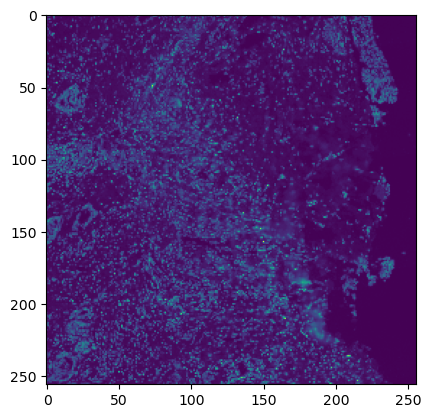

In [145]:
plt.imshow(d['img'][channels.index('DAPI')])

In [147]:
x = ds.image_from_tiles(ds.slide_to_tiles[ds.slides[0]])
x.shape

torch.Size([24, 1664, 1664])

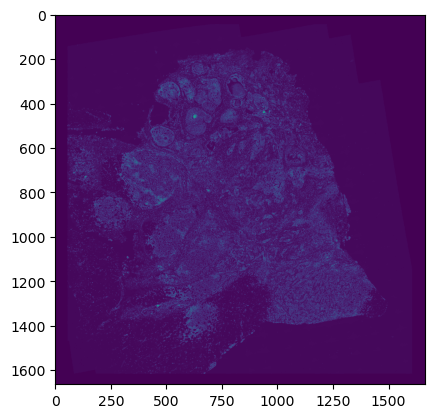

In [148]:
plt.imshow(x[channels.index('DAPI')])

In [169]:
v = ViT(
    image_size = size[0],
    patch_size = 32,
    num_classes = 1000,
    dim = 1024,
    depth = 6,
    heads = 8,
    mlp_dim = 2048,
    channels=len(channels),
)

In [170]:
v.load_state_dict(torch.load('../data/mae_v1/220000iter.pt'))
v.eval()

ViT(
  (to_patch_embedding): Sequential(
    (0): Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=32, p2=32)
    (1): LayerNorm((24576,), eps=1e-05, elementwise_affine=True)
    (2): Linear(in_features=24576, out_features=1024, bias=True)
    (3): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
  )
  (dropout): Dropout(p=0.0, inplace=False)
  (transformer): Transformer(
    (layers): ModuleList(
      (0): ModuleList(
        (0): PreNorm(
          (norm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (fn): Attention(
            (attend): Softmax(dim=-1)
            (dropout): Dropout(p=0.0, inplace=False)
            (to_qkv): Linear(in_features=1024, out_features=1536, bias=False)
            (to_out): Sequential(
              (0): Linear(in_features=512, out_features=1024, bias=True)
              (1): Dropout(p=0.0, inplace=False)
            )
          )
        )
        (1): PreNorm(
          (norm): LayerNorm((1024,), eps=1e-05, elementwise

In [176]:
mae = SlideMAE(
    encoder = v,
    n_slides = len(slide_to_img),
    masking_ratio = 0.25,   # the paper recommended 75% masked patches
    decoder_dim = 512,      # paper showed good results with just 512
    decoder_depth = 6       # anywhere from 1 to 8
)

In [172]:
# from vit_pytorch.extractor import Extractor

# v = Extractor(v)

In [173]:
b = next(iter(dl))

In [177]:
encoded_tokens = mae.encode_all(b['img'], b['slide_idx'])
encoded_tokens.shape

torch.Size([32, 65, 1024])

In [182]:
decoded_tokens, pred_pixel_values = mae.decode_all(encoded_tokens)
pred_pixel_values.shape, decoded_tokens.shape

(torch.Size([32, 64, 24576]), torch.Size([32, 65, 512]))

In [193]:
pred_patches = rearrange(
    pred_pixel_values, 'b (h w) (p1 p2 c) -> b c (h p1) (w p2)',
    h=size[0] // 32, w=size[0] // 32, p1=32, p2=32, c=len(channels))
pred_patches.shape

torch.Size([32, 24, 256, 256])

In [195]:
true_patches = rearrange(
    b['img'],
    'b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1 = 32, p2 = 32
)
true_patches = rearrange(
    true_patches, 'b (h w) (p1 p2 c) -> b c (h p1) (w p2)',
    h=size[0] // 32, w=size[0] // 32, p1=32, p2=32, c=len(channels)
)
true_patches.shape

torch.Size([32, 24, 256, 256])

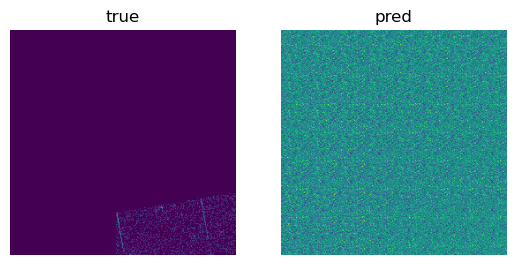

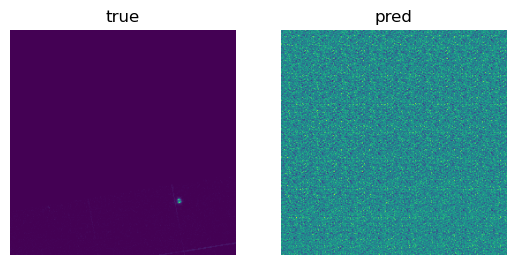

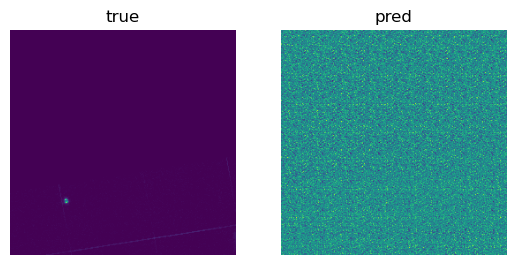

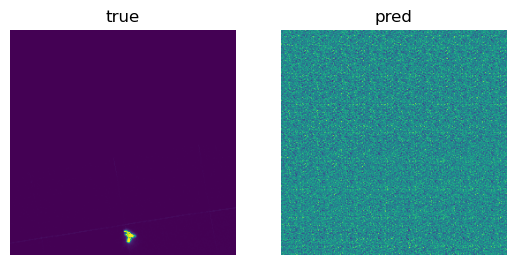

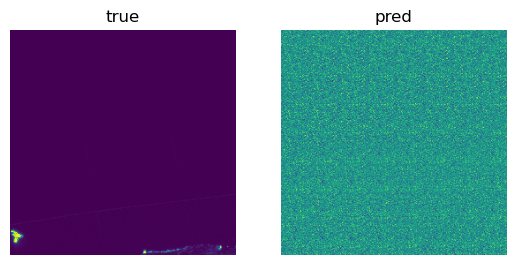

...

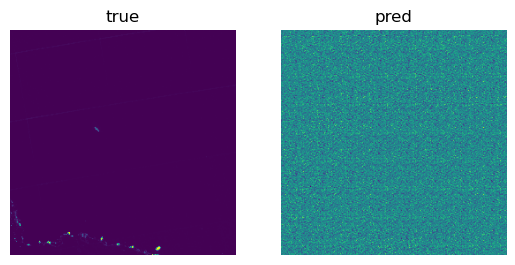

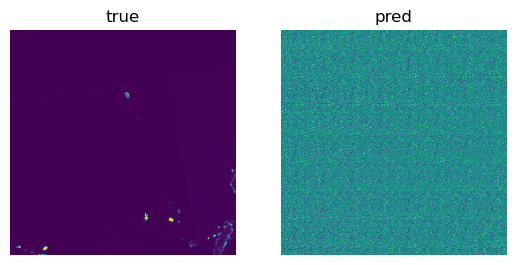

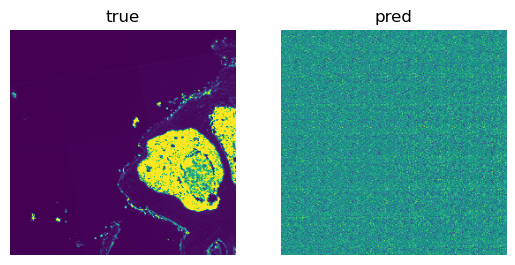

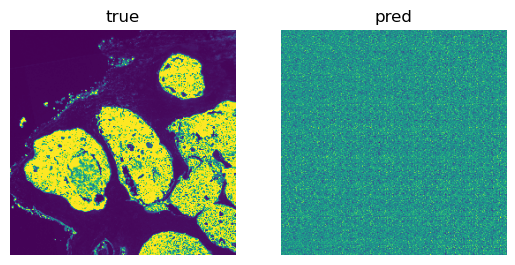

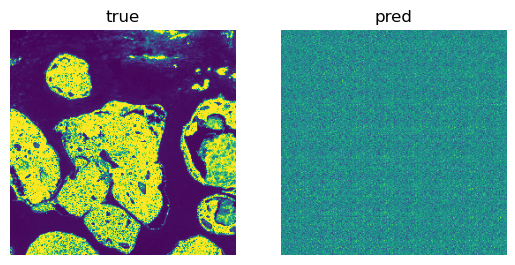

In [198]:
c = 'Pan-Cytokeratin'
for i in range(true_patches.shape[0]):
    pred = pred_patches[i, channels.index(c)].cpu().detach()
    true = true_patches[i, channels.index(c)].cpu().detach()
    
    fig, axs = plt.subplots(ncols=2)
    axs[0].imshow(true)
    axs[0].set_title('true')
    axs[0].axis('off')
    axs[1].imshow(pred)
    axs[1].set_title('pred')
    axs[1].axis('off')
    
    plt.show()
    

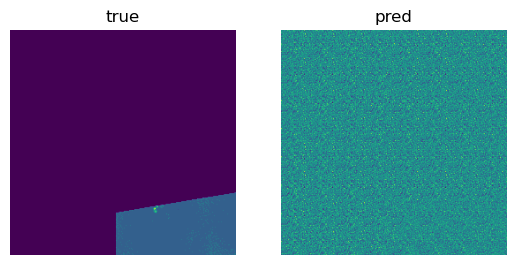

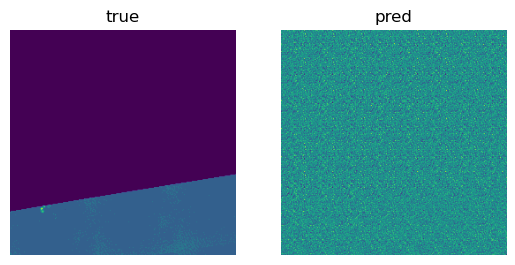

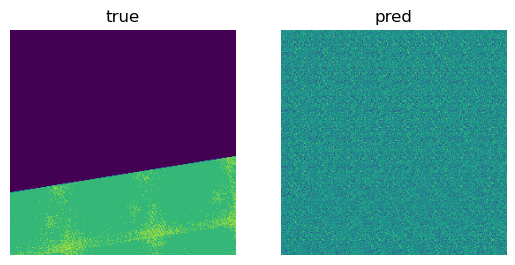

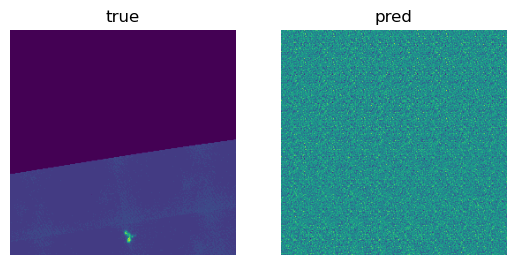

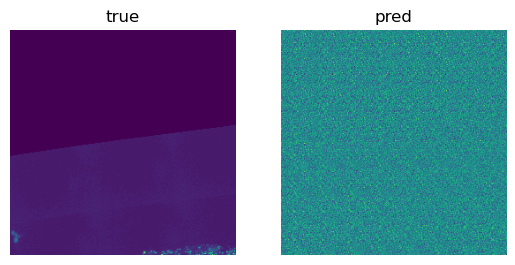

...

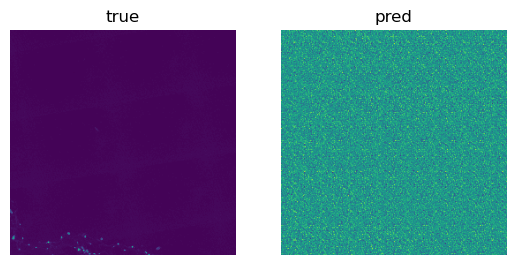

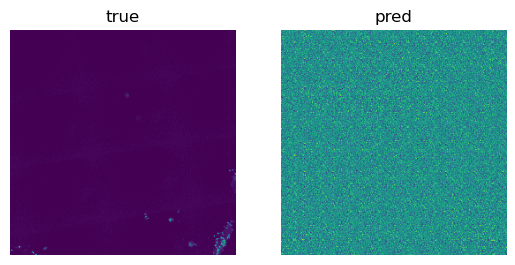

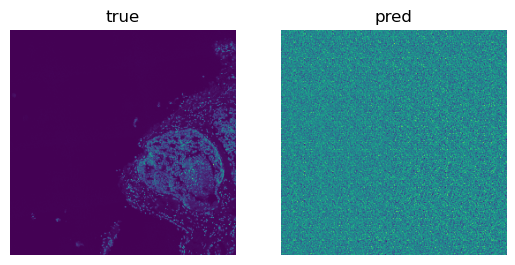

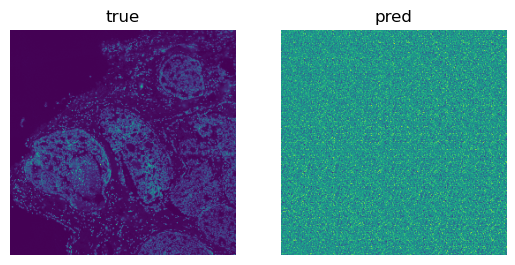

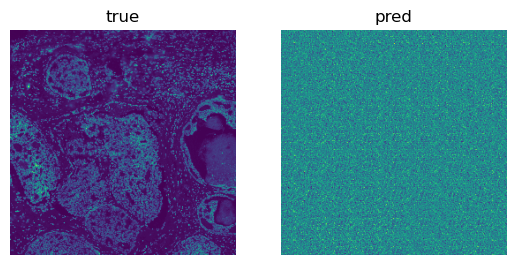

In [199]:
c = 'DAPI'
for i in range(true_patches.shape[0]):
    pred = pred_patches[i, channels.index(c)].cpu().detach()
    true = true_patches[i, channels.index(c)].cpu().detach()
    
    fig, axs = plt.subplots(ncols=2)
    axs[0].imshow(true)
    axs[0].set_title('true')
    axs[0].axis('off')
    axs[1].imshow(pred)
    axs[1].set_title('pred')
    axs[1].axis('off')
    
    plt.show()
    

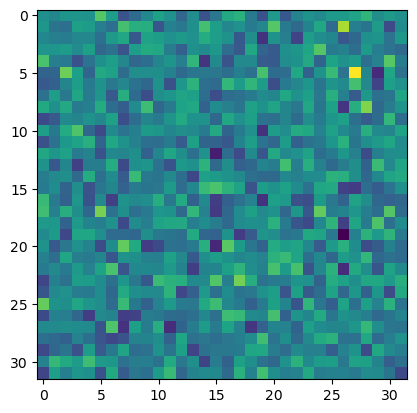

In [185]:
plt.imshow(outs[0, 0, :, :, channels.index('DAPI')].cpu().detach())

In [ ]:
c = 'Pan-Cytokeratin'
for 

In [190]:
channels

['Bap1',
 'CD31',
 'CD45',
 'CD68',
 'CD8',
 'CK14',
 'CK19',
 'COX6c',
 'DAPI',
 'ER',
 'FOXP3',
 'GATA3',
 'GLUT1',
 'HLA-DR',
 'Her2',
 'Ki67',
 'MGP',
 'PLAT/tPA',
 'PR',
 'Pan-Cytokeratin',
 'Podoplanin',
 'SMA',
 'Vimentin',
 'cKit']

In [ ]:
Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1 = patch_height, p2 = patch_width),

In [ ]:
from vit_pytorch.extractor import Extractor
v = Extractor(v)

# forward pass now returns predictions and the attention maps

img = torch.randn(1, 3, 256, 256)
logits, embeddings = v(img)

In [164]:
device = 'cuda:1'